In [1]:
%%html
<style>
.output_wrapper, .output {
    height:auto !important;
    max-width:9000px;
}
.output_scroll {
    box-shadow:none !important;
    webkit-box-shadow:none !important;
}
.container { width:100% !important; }
</style>

In [2]:
%matplotlib inline

In [3]:
import os
import io
from datetime import datetime as dt
import pandas as pd
import numpy as np
import cv2
from matplotlib import pyplot as plt

In [ ]:
train = pd.read_json("../input/train.json").fillna(-1.0).replace('na', -1.0)
test = pd.read_json("../input/test.json").fillna(-1.0).replace('na', -1.0)

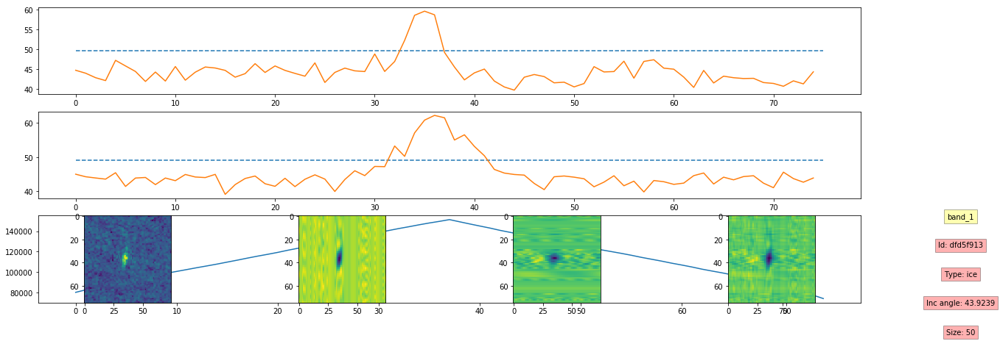

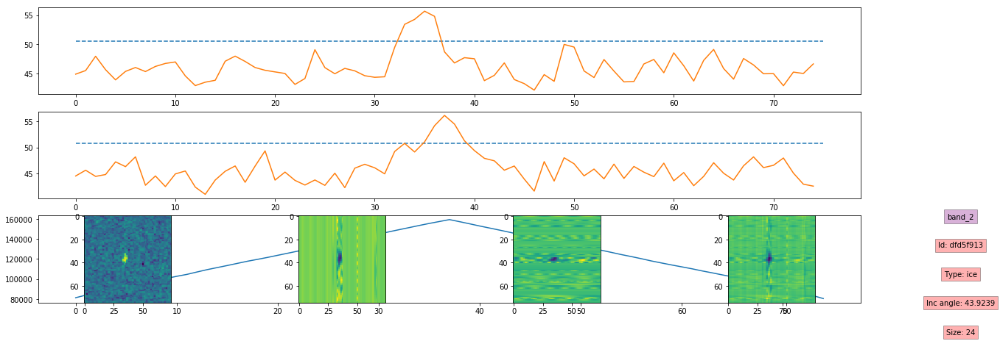

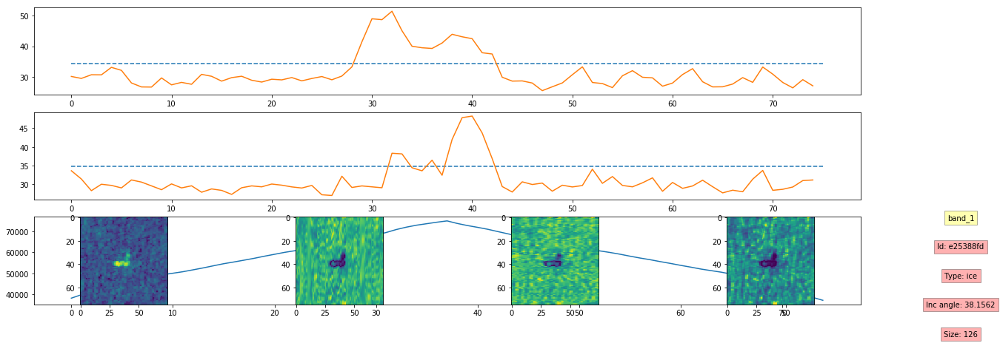

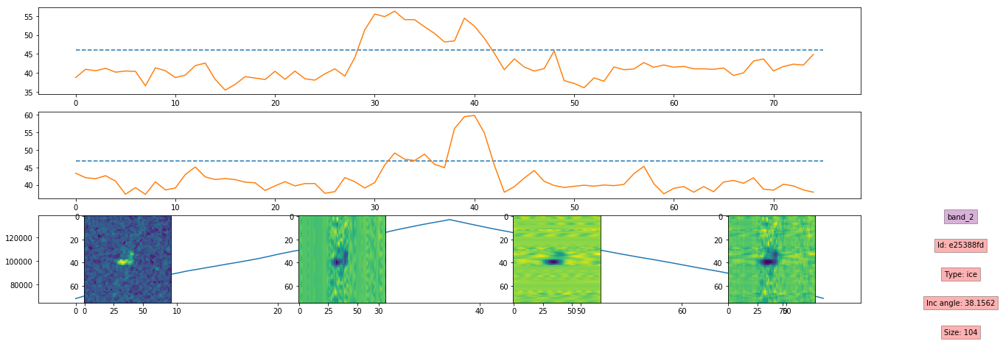

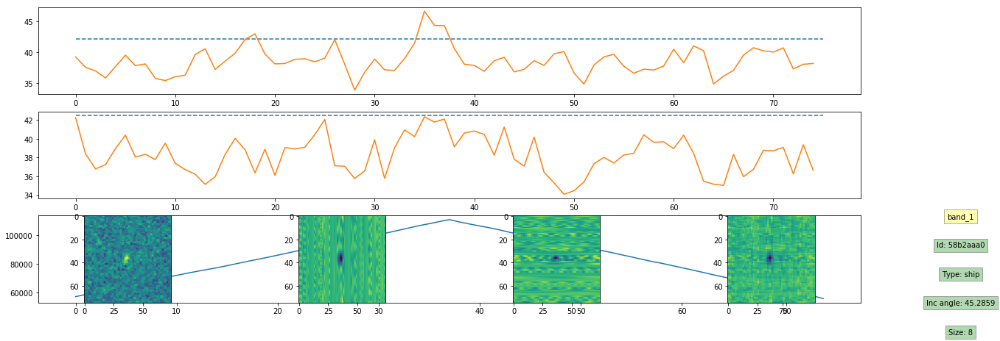

...

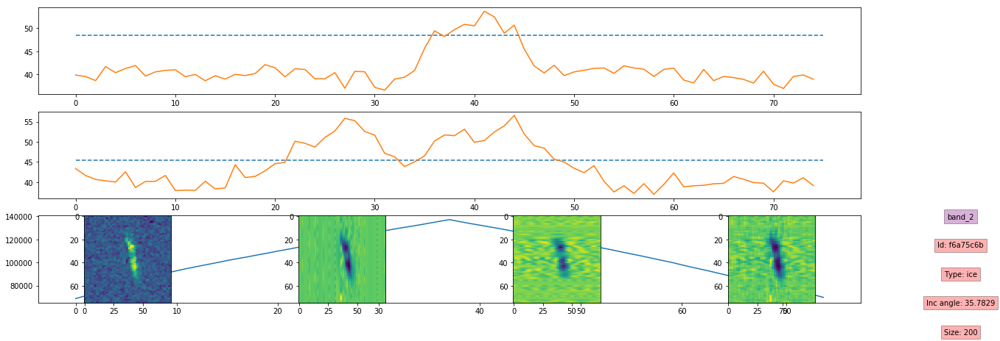

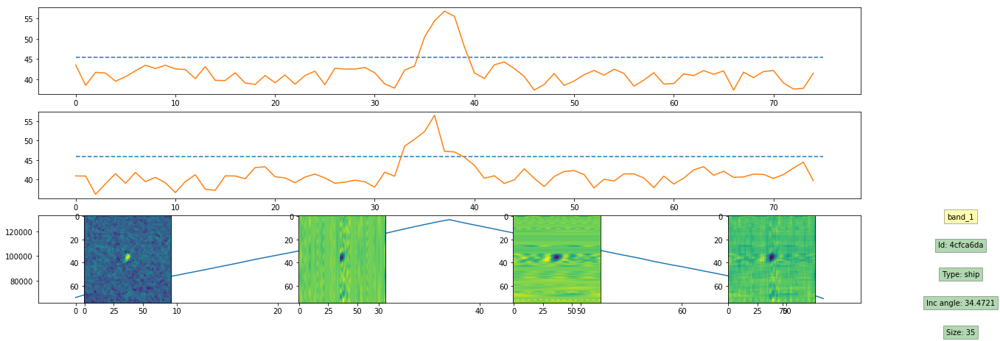

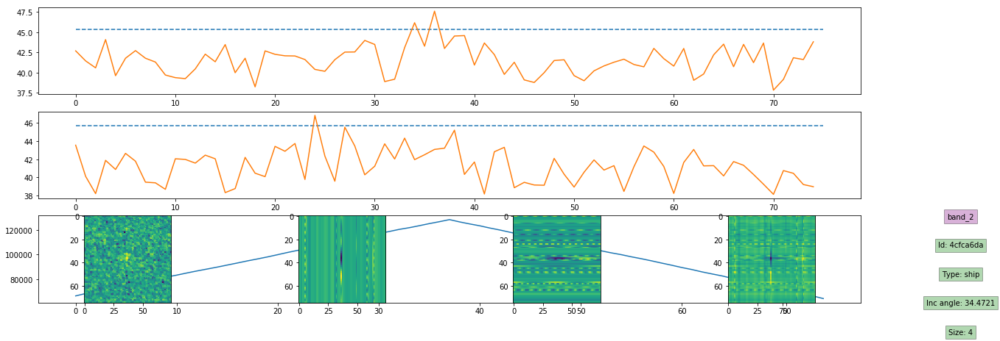

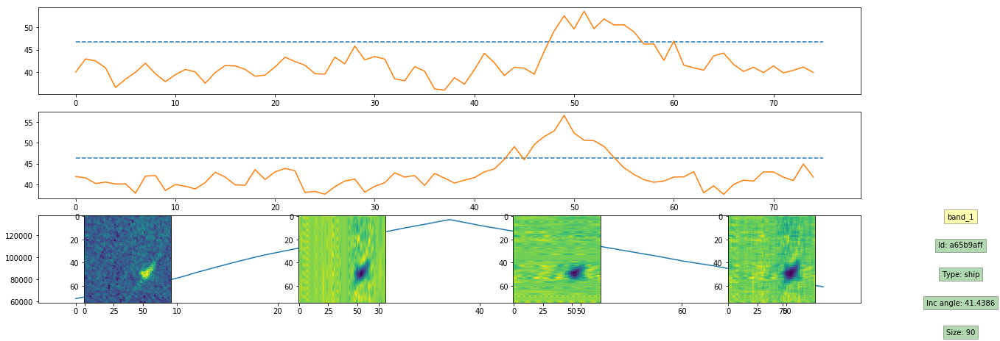

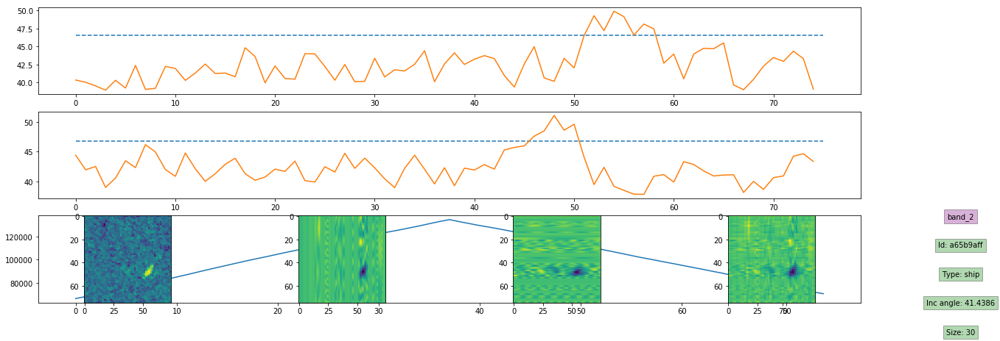

In [ ]:
for j in range(0,1605):
    dt = train
    if len(str(dt.iloc[j,:].inc_angle))<=7:
        for band in ['band_1', 'band_2']:
            x = np.array(dt.iloc[j,:][band])
            multiplier = 1.1
            threshold_h = 45.0
            threshold_v = 45.0
            mean_value = {}
            mean_value['h'] = []
            xx = []
            sph = None
            for i in range(75):
                th = np.reshape(x,(75,75))[i,:]
                sph = np.fft.fft(th)
                mnh = np.mean(abs(sph))     
                sph[abs(sph)<mnh*multiplier] = 0.0
                xx.append(abs(np.fft.ifft(sph)))
                mean_value['h'].append(mnh)
            mxh = np.max(mean_value['h'])
            mih = np.min(mean_value['h'])
            mnh = np.mean(mean_value['h'])
            mean_value['v']=[]
            yy = []
            spv = None
            for i in range(75):
                tv = np.reshape(x,(75,75))[:,i]
                spv = np.fft.fft(tv)
                mnv = np.mean(abs(spv))
                spv[abs(spv)<mnv*multiplier] = 0.0
                yy.append(abs(np.fft.ifft(spv)))
                mean_value['v'].append(mnv)
            mxv = np.max(mean_value['v'])
            miv = np.min(mean_value['v'])                
            mnv = np.mean(mean_value['v'])
                
            estimate_size = sum(mean_value['v'] > mnv*multiplier)*sum(mean_value['h'] > mnh*multiplier)
            yy = np.transpose(yy)
            if True:        
                fig = plt.figure(1,figsize=(20,10))
                # vertical FFT means
                ax = fig.add_subplot(4,1,1)
                plt.plot((0, 75), (mnh*multiplier, mnh*multiplier), '--')
                ax.plot(mean_value['v'])

                # horizontal FFT means
                axx = fig.add_subplot(4,1,2)
                plt.plot((0, 75), (mnv*multiplier, mnv*multiplier), '--')
                axx.plot(mean_value['h'])

                
                axz = fig.add_subplot(4,1,3)
                axz.plot(np.convolve(mean_value['h'], mean_value['v'], 'same'))
                
                # original
                axxx = fig.add_subplot(4,4,9)
                axxx.imshow(np.reshape(x,(75,75)))

                # vertial ifft 
                axxx = fig.add_subplot(4,4,10)
                axxx.imshow(yy)

                # horizontal ifft 
                axxx = fig.add_subplot(4,4,11)
                axxx.imshow(xx)

                # vertical * horizontal ifft
                axxx = fig.add_subplot(4,4,12)
                axxx.imshow(np.array(yy)*np.array(xx))

                txx = ''
                fc = 'blue'
                if 'is_iceberg' in dt.columns:
                    if dt.iloc[j,:].is_iceberg==0:
                        txx = 'ice'
                        fc = 'red'
                    else:
                        txx = 'ship'
                        fc = 'green'

                if band == 'band_1':
                    fcc = 'yellow'
                else:
                    fcc = 'purple'
                axxx.text(200,0,  '%s' % (band), color='k', bbox=dict(facecolor=fcc, alpha=0.3), horizontalalignment='center', verticalalignment='center')
                axxx.text(200,25,  'Id: %s' % (dt.iloc[j,:].id), color='k', bbox=dict(facecolor=fc, alpha=0.3), horizontalalignment='center', verticalalignment='center')
                axxx.text(200,50, 'Type: %s' % (txx), color='k', bbox=dict(facecolor=fc, alpha=0.3), horizontalalignment='center', verticalalignment='center')
                axxx.text(200,75, 'Inc angle: %s' % (dt.iloc[j,:].inc_angle), color='k', bbox=dict(facecolor=fc, alpha=0.3), horizontalalignment='center', verticalalignment='center')
                
                axxx.text(200,100, 'Size: %s' % (estimate_size), color='k', bbox=dict(facecolor=fc, alpha=0.3), horizontalalignment='center', verticalalignment='center')
                #axxx.text(200,70,'avg H: %s avg V: %s' % (np.mean(abs(sp))), color='k', bbox=dict(facecolor=fc, alpha=0.3), horizontalalignment='center', verticalalignment='center')

                plt.show()